In [1]:
# Load packages
suppressPackageStartupMessages({
    library(ggplot2)
    library(BiocParallel)
    library(scran)
    library(SingleCellExperiment)
    library(Seurat)
    library(data.table)
    library(dplyr)
    library(viridis)
    library(ggrastr)
    library(ggrepel)
    library(parallel)
    library(Matrix)
})
    ncores = 8
    mcparam = MulticoreParam(workers = ncores)
    register(mcparam)
    BPPARAM = SerialParam()

options(repr.plot.width=15, repr.plot.height=8)

In [2]:
main = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/'

In [3]:
sce = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/processed/SingleCellExperiment.rds')
meta = fread('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/sample_metadata_extended.txt.gz')

In [4]:
meta = fread('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/sample_metadata_extended.txt.gz')

In [5]:
summary(colnames(sce) == meta$cell)

   Mode    TRUE 
logical  116312 

In [6]:
genenames = fread("/rds/project/rds-SDzz0CATGms/users/bt392/gene_names.csv") %>% 
            setnames(c('ensembl_gene_id','external_gene_name'), c('gene', 'gene_name'))
genenames = genenames[genenames$gene %in% rownames(sce)]
genenames = merge(genenames, as.data.frame(rownames(sce)), by.x='gene', by.y='rownames(sce)', all.y=TRUE)
genenames$gene_name[genenames$gene_name==''] = NA
genenames[is.na(genenames$gene_name),] = genenames$gene[is.na(genenames$gene_name)]
genenames = genenames[order(match(genenames$gene, rownames(sce)))]
rownames(sce) = genenames$gene_name

In [7]:
sce = logNormCounts(sce)

In [8]:
sce

class: SingleCellExperiment 
dim: 29452 116312 
metadata(1): log.exprs.offset
assays(2): counts logcounts
rownames(29452): Xkr4 Gm1992 ... ENSMUSG00000096730 ENSMUSG00000095742
rowData names(0):
colnames(116312): cell_1 cell_2 ... cell_139330 cell_139331
colData names(1): sizeFactor
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [9]:
plot_gene = function(x){
    meta$gene = as.vector(logcounts(sce[x,]))
    meta = meta[order(gene)]
    ggplot(meta, aes(umapX, umapY, col=gene)) + 
        geom_point(size = 0.4) + 
        scale_color_viridis(option='magma') + 
        labs(title = x) +
        theme_void() + 
        theme(legend.position = 'none', 
              plot.title = element_text(size=25, hjust=0.5))
    }

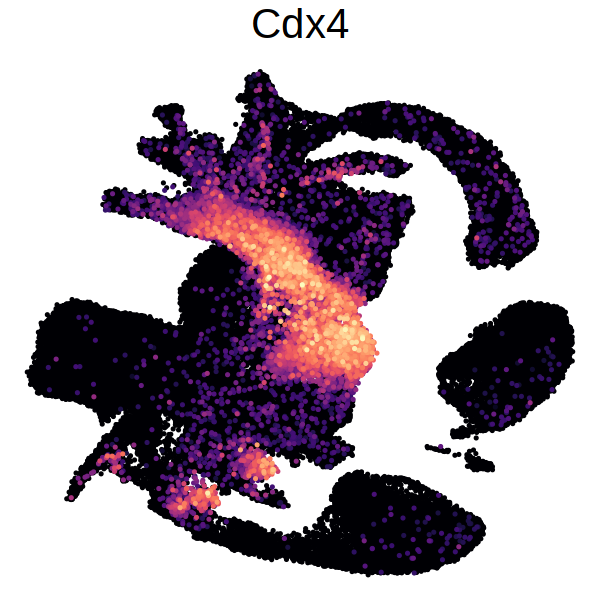

In [10]:
options(repr.plot.width=5, repr.plot.height=5)

plot_gene('Cdx4')

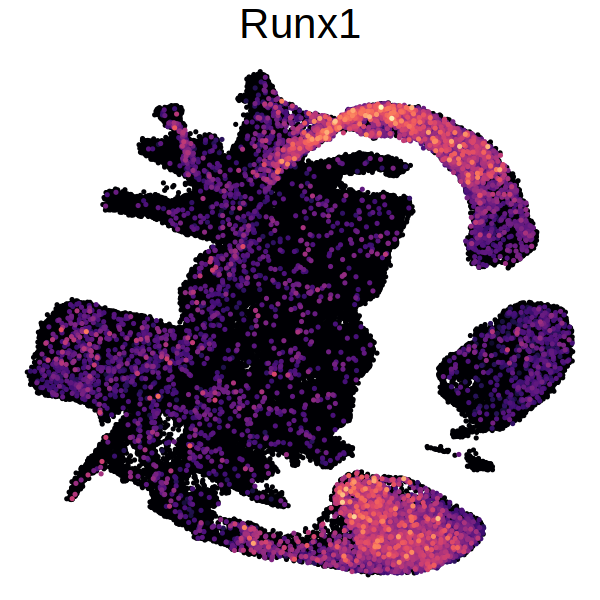

In [10]:
options(repr.plot.width=5, repr.plot.height=5)

plot_gene('Runx1')

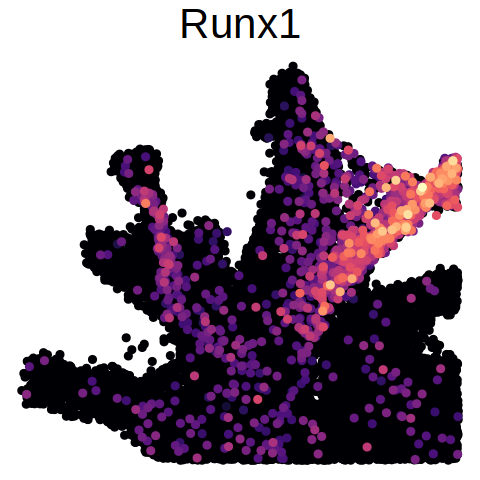

In [13]:
options(repr.plot.width=4, repr.plot.height=4)
x = 'Runx1'
tmp = meta
tmp$gene = as.vector(logcounts(sce[x,]))   
tmp = tmp[order(tmp$gene)]
    tmp = tmp[umapX>=-10 & umapX <=2.5 & umapY>=7]
    ggplot(tmp, aes(umapX, umapY, col=gene)) + 
        geom_point(size = 1.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = x) +
        theme_void() + 
        theme(legend.position = 'none', 
              plot.title = element_text(size=25, hjust=0.5))

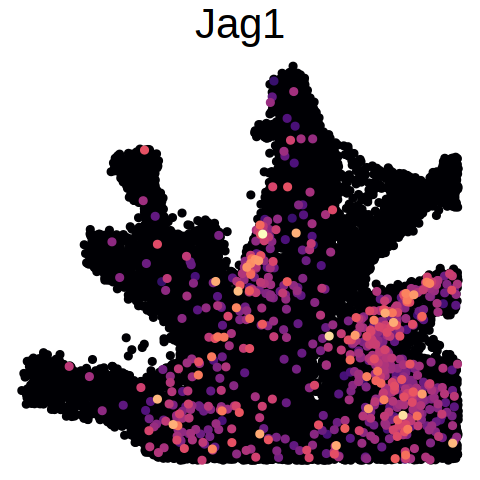

In [18]:
options(repr.plot.width=4, repr.plot.height=4)
x = 'Jag1'
tmp = meta
tmp$gene = as.vector(logcounts(sce[x,]))   
tmp = tmp[order(tmp$gene)]
    tmp = tmp[umapX>=-10 & umapX <=2.5 & umapY>=7]
    ggplot(tmp, aes(umapX, umapY, col=gene)) + 
        geom_point(size = 1.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = x) +
        theme_void() + 
        theme(legend.position = 'none', 
              plot.title = element_text(size=25, hjust=0.5))

In [11]:
x = 'Dlk1'
tmp = meta
tmp$gene = as.vector(logcounts(sce[x,]))

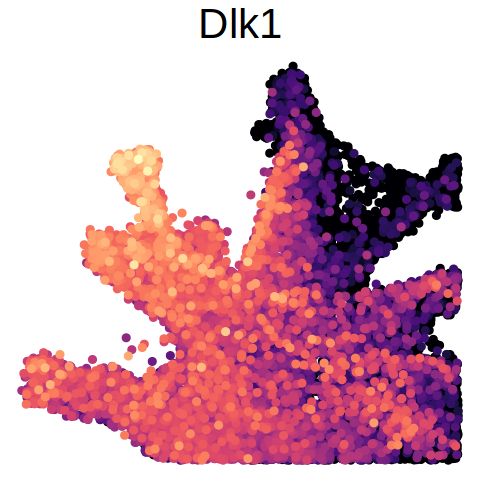

In [66]:
options(repr.plot.width=4, repr.plot.height=4)

    tmp = tmp[order(tmp$gene)]
    tmp = tmp[umapX>=-10 & umapX <=2.5 & umapY>=7]
    ggplot(tmp, aes(umapX, umapY, col=gene)) + 
        geom_point(size = 1.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = x) +
        theme_void() + 
        theme(legend.position = 'none', 
              plot.title = element_text(size=25, hjust=0.5))

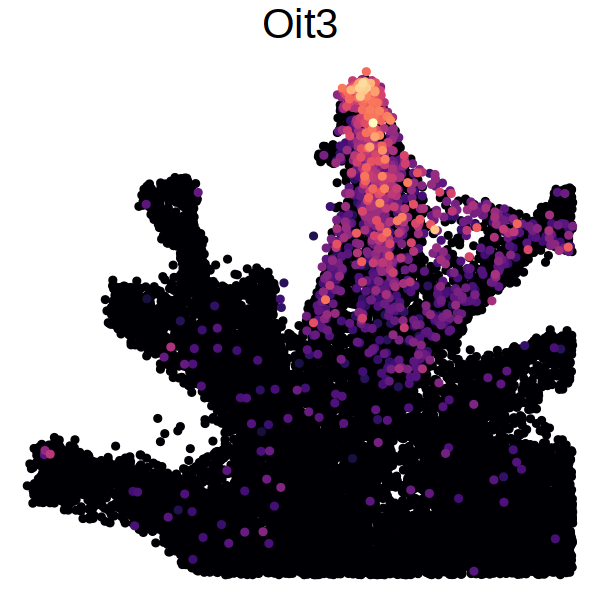

In [14]:
x = 'Oit3'
tmp = meta
tmp$gene = as.vector(logcounts(sce[x,]))
    tmp = tmp[order(tmp$gene)]
    tmp = tmp[umapX>=-10 & umapX <=2.5 & umapY>=7]
    ggplot(tmp, aes(umapX, umapY, col=gene)) + 
        geom_point(size = 1.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = x) +
        theme_void() + 
        theme(legend.position = 'none', 
              plot.title = element_text(size=25, hjust=0.5))

In [77]:
unique(meta$stage)

[1] "E6.5"               "E7.5"               "E6.75"             
 [4] "E7.75"              "E7.0"               "E8.0"              
 [7] "E8.5"               "mixed_gastrulation" "E7.25"             
[10] "E8.25"

In [82]:
celltype_proportions = meta %>% copy() %>%
    .[,Ntot := .N, by = c('stage')] %>%
    .[,proportion := .N/Ntot, by = c('stage', 'celltype_extended')] %>% 
    unique(by = c('stage', 'celltype_extended')) %>% 
   # .[,celltype_v1 := factor(celltype_v1, levels = rev(c('Primitive_Streak', 'Early_Mes_EOd', 
   #                                                  'HE_Precursor','Blood_Progenitor', 'HE','Endothelium',   'Early_Mes_EOi',
   #                                                   'Allantois','Allantois_Precursor','Posterior_Mes', 'Mesenchyme'
   #                                                   )))] %>% 
    .[,stage := factor(stage, levels = c("E6.5" ,
                                        "E6.75",
                                        "E7.0" ,
                                        "E7.25",
                                        "E7.5" ,
                                        "E7.75",
                                        "E8.0" ,
                                        "E8.25",
                                        "E8.5" ))] %>% 
    .[, c('stage',  'celltype_extended', 'proportion')]

all = expand.grid(unique(celltype_proportions$stage), unique(celltype_proportions$celltype_extended)) %>%
    setnames(c('stage', 'celltype_extended'))

celltype_proportions = merge(celltype_proportions, all, by = c('stage', 'celltype_extended'), all=TRUE) %>% 
    .[,proportion:= ifelse(is.na(proportion), 0, proportion)] %>%
    .[!is.na(stage)]

In [85]:
opts = list()
opts$celltype_extended.colors = c(
"Epiblast" = "#635547",
"Primitive_Streak" = "#DABE99",
"Caudal_epiblast" = "#9e6762",

"PGC" = "#FACB12",

"Anterior_Primitive Streak" = "#c19f70",
"Node"="#153b3d",
"Notochord" = "#0F4A9C",



"Gut_tube" = "#EF5A9D",
"Hindgut" = "#F397C0",
"Midgut" = "#ff00b2",
"Foregut" = "#ffb7ff",
"Pharyngeal_endoderm"="#95e1ff",
"Thyroid_primordium"="#97bad3",

"Nascent_mesoderm" = "#C594BF",
"Intermediate_mesoderm" = "#139992",
"Caudal_mesoderm" = "#3F84AA",
"Lateral_plate_mesoderm" = "#F9DFE6",
"Limb_mesoderm" = "#e35f82",
"Forelimb" = "#d02d75",
"Kidney_primordium" = "#e85639",
"Presomitic_mesoderm"="#5581ca",#"#0000ff",#blue
"Somitic_mesoderm" = "#005579",
"Posterior_somitic tissues" = "#5adbe4",#"#40e0d0",#turquoise



"Paraxial_mesoderm" = "#8DB5CE",
"Cranial_mesoderm" = "#456722",#"#006400",#darkgreen
"Anterior_somitic_tissues"= "#d5e839",
"Sclerotome" = "#e3cb3a",#"#ffff00",#yellow
"Dermomyotome" = "#00BFC4",#"#a52a2a",#brown



"Pharyngeal_mesoderm" = "#C9EBFB",
"Cardiopharyngeal_progenitors" = "#556789",
"Anterior_cardiopharyngeal_progenitors"="#683ed8",



"Allantois" = "#532C8A",
"Mesenchyme" = "#cc7818",
"YS_mesothelium" = "#ff7f9c",
"Epicardium"="#f79083",
"Embryo_proper_mesothelium" = "#ff487d",



"Cardiopharyngeal_progenitors_FHF"="#d780b0",
"Cardiomyocytes_FHF_1"="#a64d7e",
"Cardiomyocytes_FHF_2"="#B51D8D",



"Cardiopharyngeal_progenitors_SHF"="#4b7193",
"Cardiomyocytes_SHF_1"="#5d70dc",
"Cardiomyocytes_SHF_2"="#332c6c",



"Haematoendothelial_progenitors" = "#FBBE92",
"Blood_progenitors" = "#6c4b4c",
"Erythroid" = "#C72228",
"Chorioallantoic-derived_erythroid_progenitors"="#E50000",
"Megakaryocyte_progenitors"="#e3cb3a",
"MEP"="#EF4E22",
"EMP"="#7c2a47",



"YS_endothelium"="#ff891c",
"YS_mesothelium-derived_endothelial_progenitors"="#AE3F3F",
"Allantois_endothelium"="#2f4a60",
"Embryo_proper_endothelium"="#90e3bf",
"Venous_endothelium"="#bd3400",
"Endocardium"="#9d0049",

"NMPs_Mesoderm-biased" = "#89c1f5",
"NMPs" = "#8EC792",

"Ectoderm" = "#ff675c",



"Optic_vesicle" = "#bd7300",

"Ventral_forebrain_progenitors"="#a0b689",
"Early_dorsal_forebrain_progenitors"="#0f8073",
"Late_dorsal_forebrain_progenitors"="#7a9941",
"Midbrain_Hindbrain_boundary"="#8ab3b5",
"Midbrain_progenitors"="#9bf981",
"Dorsal_midbrain_neurons"="#12ed4c",
"Ventral_hindbrain_progenitors"="#7e907a",
"Dorsal_hindbrain_progenitors"="#2c6521",
"Hindbrain_floor_plate"="#bf9da8",
"Hindbrain_neural_progenitors"="#59b545",



"Neural_tube"="#233629",



"Migratory_neural_crest"="#4a6798",
"Branchial_arch_neural_crest"="#bd84b0",
"Frontonasal_mesenchyme"="#d3b1b1",



"Spinal_cord_progenitors"="#6b2035",
"Dorsal_spinal_cord_progenitors"="#e273d6",

"Non-neural_ectoderm" = "#f7f79e",
"Surface_ectoderm" = "#fcff00",
"Epidermis" = "#fff335",
"Limb_ectoderm" = "#ffd731",
"Amniotic_ectoderm" = "#dbb400",



"Placodal_ectoderm" = "#ff5c00",



"Otic_placode"="#f1a262",
"Otic_neural progenitors"="#00b000",

"Visceral_endoderm" = "#F6BFCB",
"ExE_endoderm" = "#7F6874",
"ExE_ectoderm" = "#989898",
"Parietal_endoderm" = "#1A1A1A"
)

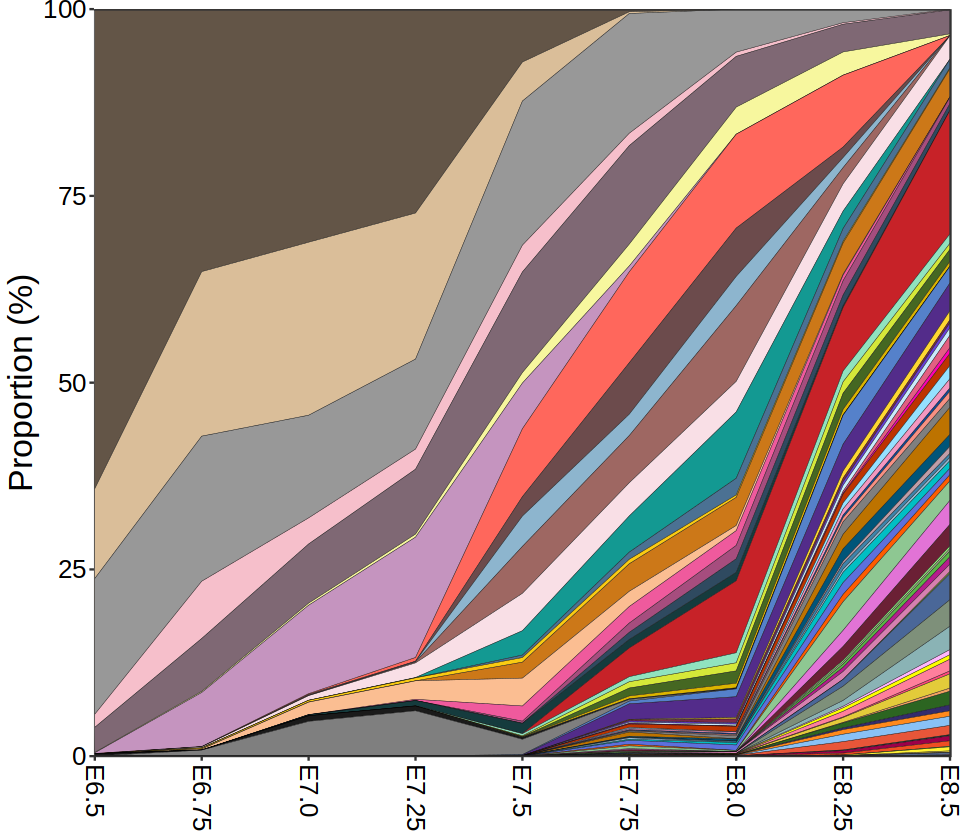

In [89]:
options(repr.plot.width=8, repr.plot.height=7)
p = ggplot(celltype_proportions, aes(stage, proportion*100, group=celltype_extended, fill=celltype_extended)) + 
    geom_area(color='black', size=0.1) + 
    scale_fill_manual(values=opts$celltype_extended.colors, name = 'Celltype') + 
    ylab('Proportion (%)') +
      scale_x_discrete(expand = c(0, 0)) +
      scale_y_continuous(expand = c(0, 0)) +
    theme_bw() + 
    theme(strip.background = element_blank(),
          strip.text = element_text(size=25),
          axis.text = element_text(size=15, color='black'),
          axis.text.x = element_text(angle=-90, hjust=0, vjust=0.5),
          axis.title.y = element_text(size=20),
          axis.title.x = element_blank(),
          legend.text = element_text(size=15, color='black'),
          legend.title = element_text(size=20),
         legend.position='none')
p

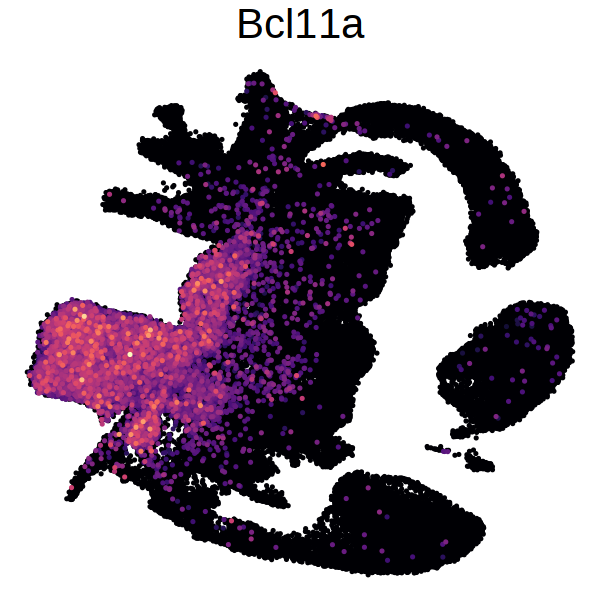

In [11]:
options(repr.plot.width=5, repr.plot.height=5)

plot_gene('Bcl11a')

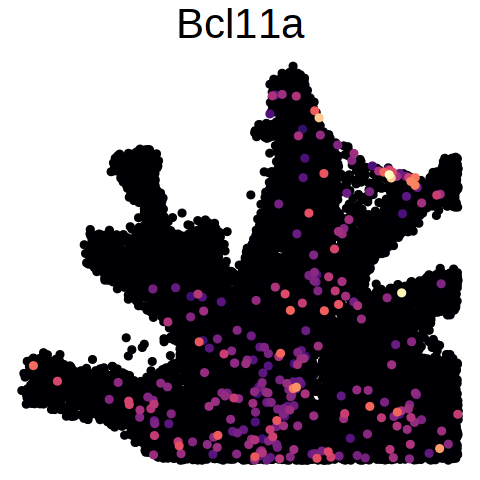

In [14]:
options(repr.plot.width=4, repr.plot.height=4)
x = 'Bcl11a'
tmp = meta
tmp$gene = as.vector(logcounts(sce[x,]))
    tmp = tmp[order(tmp$gene)]
    tmp = tmp[umapX>=-2.5 & umapX <=2.5 & umapY>=7]
    ggplot(tmp, aes(umapX, umapY, col=gene)) + 
        geom_point(size = 1.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = x) +
        theme_void() + 
        theme(legend.position = 'none', 
              plot.title = element_text(size=25, hjust=0.5))

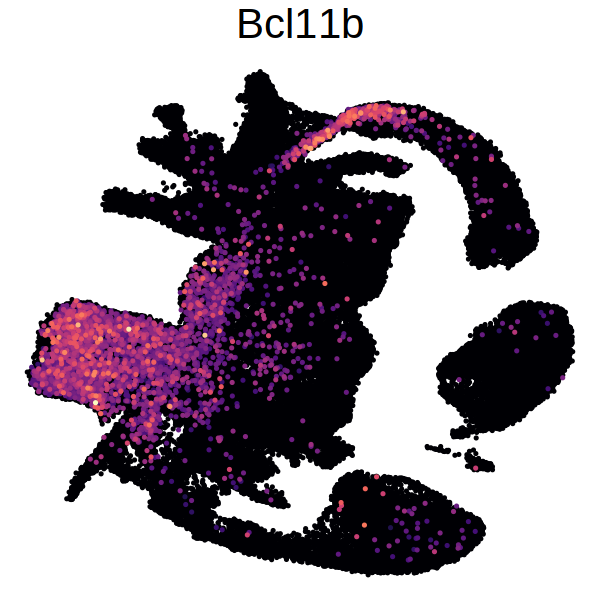

In [12]:
options(repr.plot.width=5, repr.plot.height=5)

plot_gene('Bcl11b')

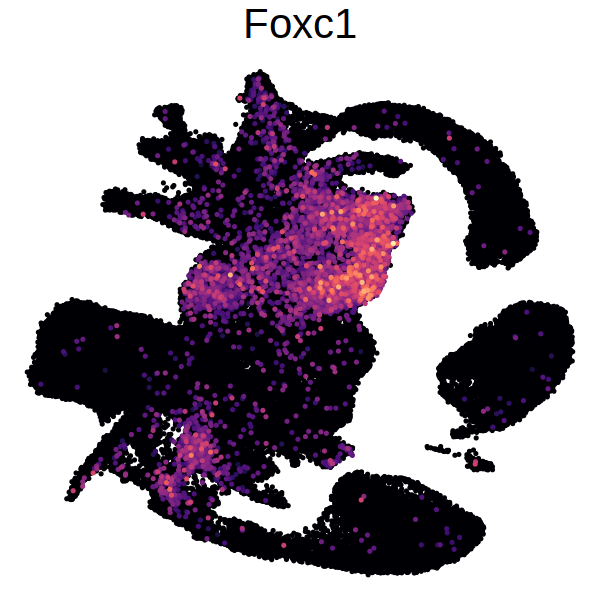

In [12]:
options(repr.plot.width=5, repr.plot.height=5)

plot_gene('Foxc1')

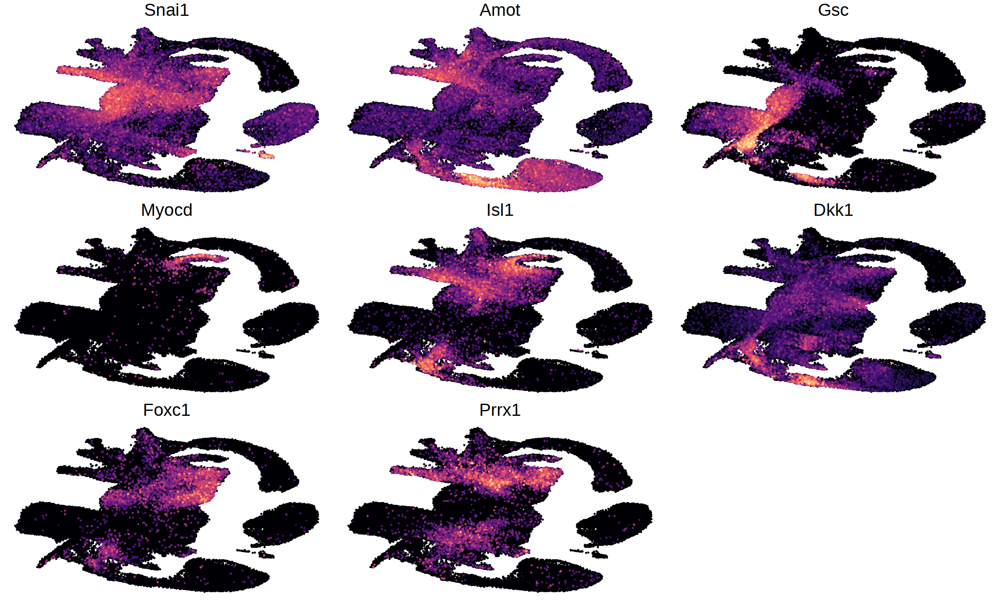

In [21]:
marker_genes = c('Snai1', 'Amot', 'Gsc', 'Myocd', 'Isl1', 'Dkk1', 'Foxc1', 'Prrx1')
p = mclapply(marker_genes, plot_gene, mc.cores=8)
options(repr.plot.width=20, repr.plot.height=12)
cowplot::plot_grid(plotlist=p, ncol=3)

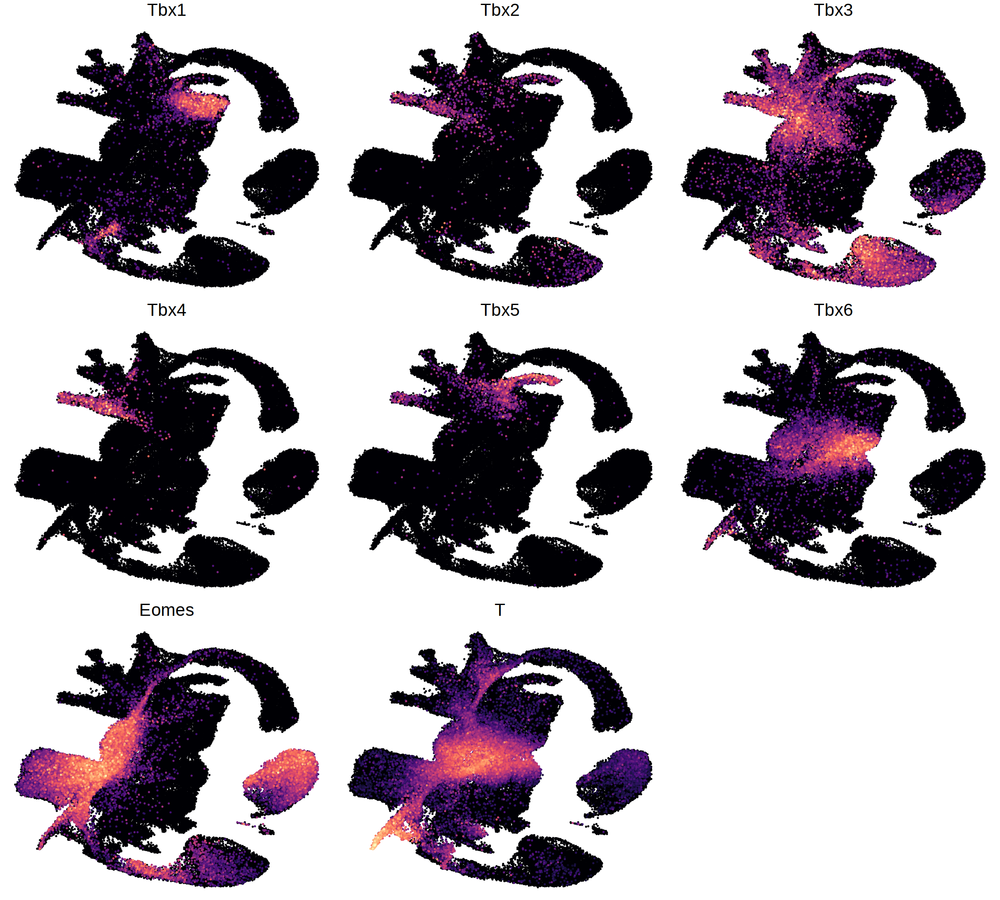

In [39]:
marker_genes = c(paste0('Tbx', 1:6), 'Eomes', 'T')
p = mclapply(marker_genes, plot_gene, mc.cores=8)
options(repr.plot.width=20, repr.plot.height=18)
cowplot::plot_grid(plotlist=p, ncol=3)

Warning message in mclapply(marker_genes, plot_gene, mc.cores = 8):
“scheduled core 5 encountered error in user code, all values of the job will be affected”
Warning message in as_grob.default(plot):
“Cannot convert object of class try-error into a grob.”


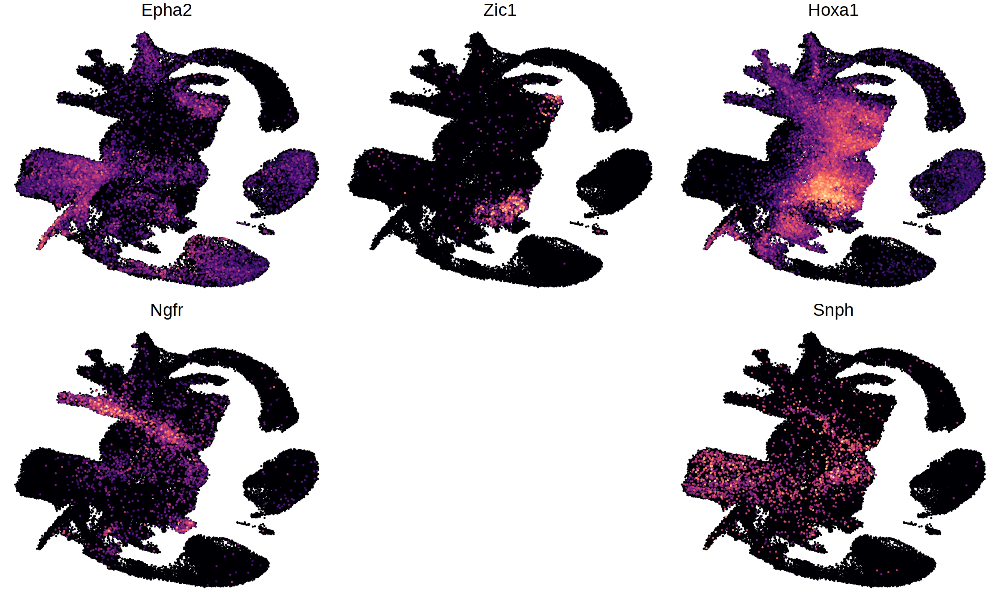

In [22]:
marker_genes = c('Epha2', 'Zic1', 'Hoxa1', 'Ngfr', 'Nfem', 'Snph')
p = mclapply(marker_genes, plot_gene, mc.cores=8)
options(repr.plot.width=20, repr.plot.height=12)
cowplot::plot_grid(plotlist=p, ncol=3)

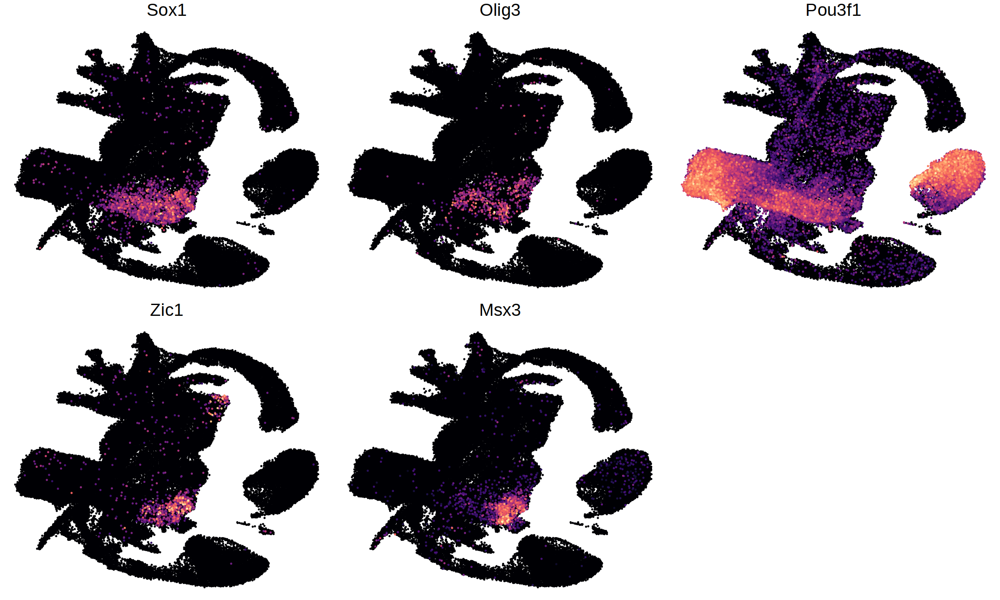

In [28]:
marker_genes = c('Sox1', 'Olig3', 'Pou3f1', 'Zic1', 'Msx3')
p = mclapply(marker_genes, plot_gene, mc.cores=8)
options(repr.plot.width=20, repr.plot.height=12)
cowplot::plot_grid(plotlist=p, ncol=3)

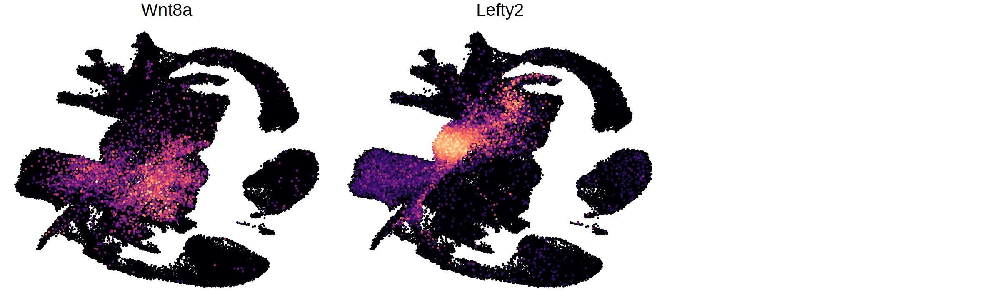

In [27]:
marker_genes = c('Wnt8a', 'Lefty2')
p = mclapply(marker_genes, plot_gene, mc.cores=8)
options(repr.plot.width=20, repr.plot.height=6)
cowplot::plot_grid(plotlist=p, ncol=3)

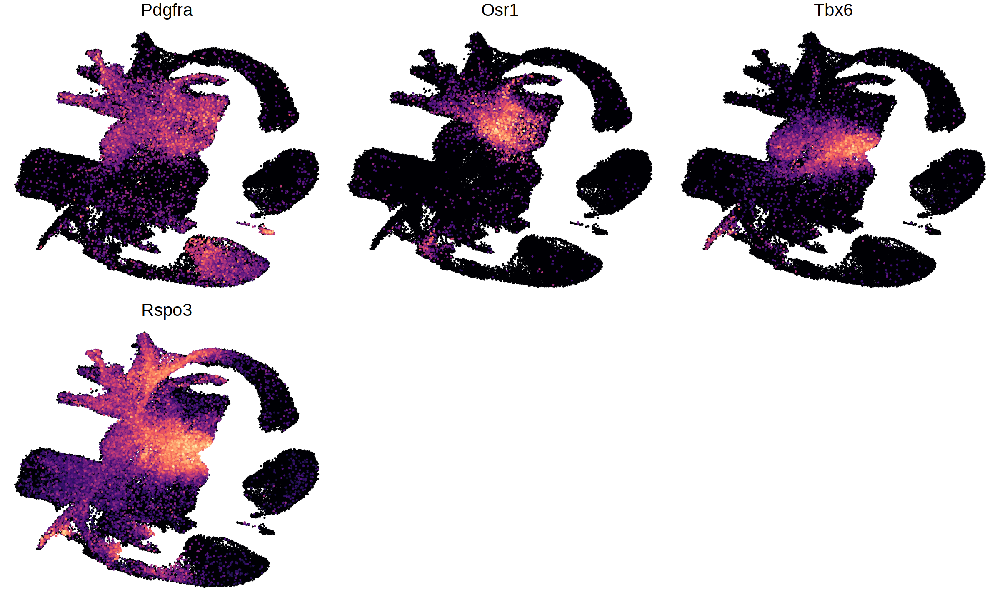

In [34]:
marker_genes = c('Pdgfra',  'Osr1', 'Tbx6', 'Rspo3')
p = mclapply(marker_genes, plot_gene, mc.cores=8)
options(repr.plot.width=20, repr.plot.height=12)
cowplot::plot_grid(plotlist=p, ncol=3)

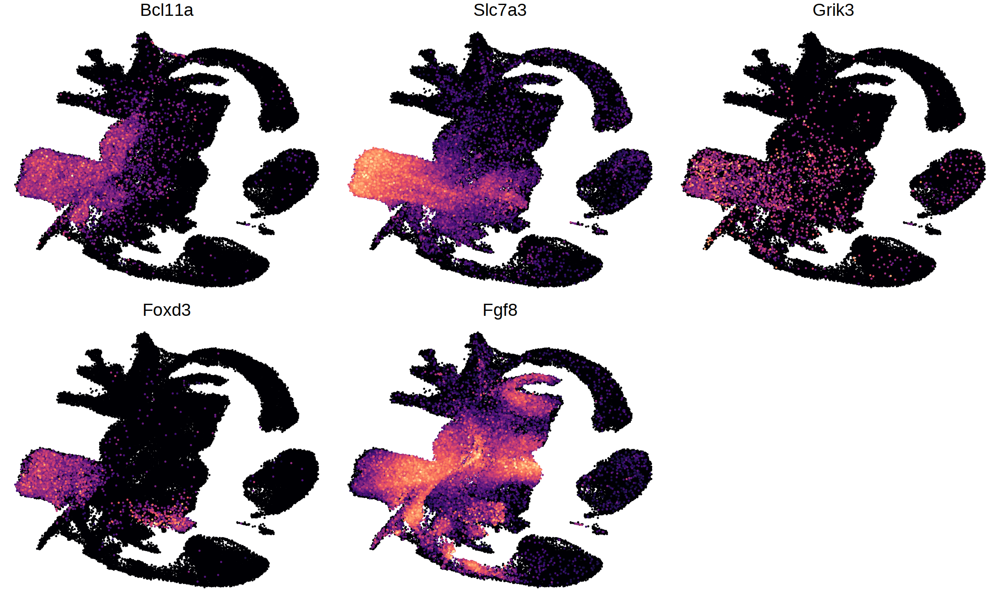

In [31]:
marker_genes = c('Bcl11a', 'Slc7a3', 'Grik3', 'Foxd3', 'Fgf8')
p = mclapply(marker_genes, plot_gene, mc.cores=8)
options(repr.plot.width=20, repr.plot.height=12)
cowplot::plot_grid(plotlist=p, ncol=3)

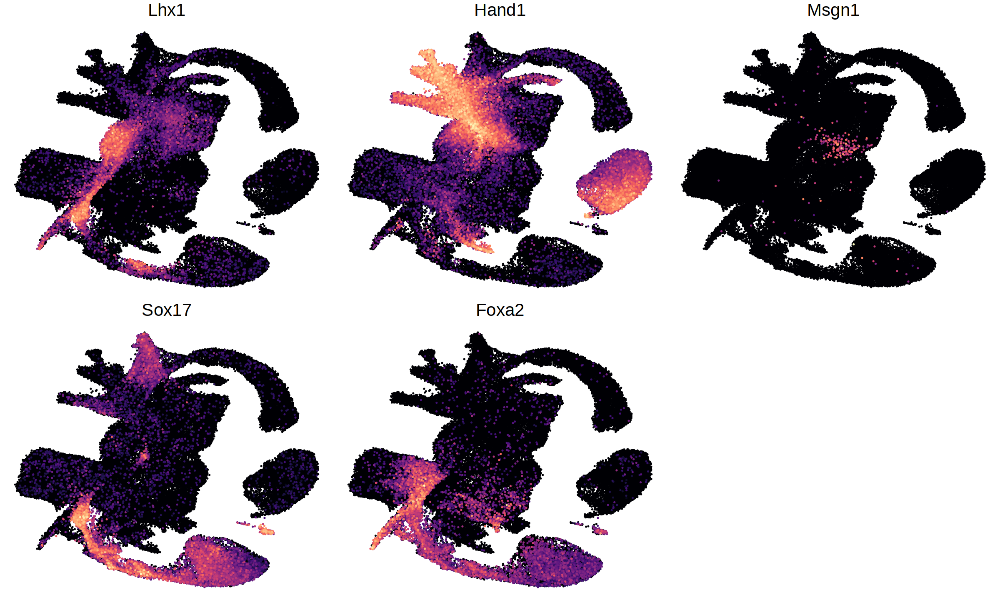

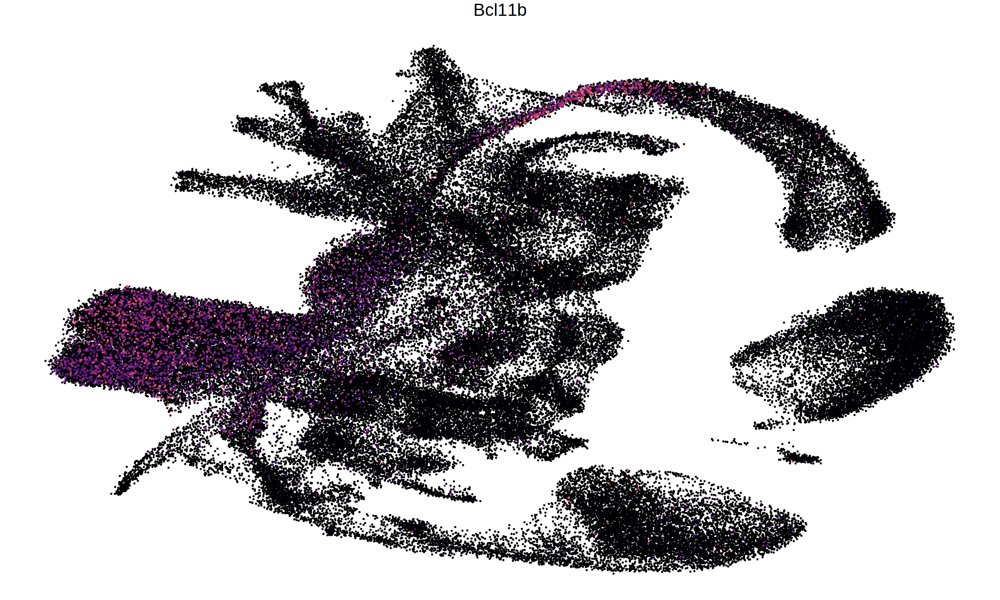

In [11]:
marker_genes = c('Lhx1', 'Hand1', 'Msgn1', 'Sox17', 'Foxa2')
p = lapply(marker_genes, plot_gene)
options(repr.plot.width=20, repr.plot.height=12)
cowplot::plot_grid(plotlist=p, ncol=3)